In [44]:
from discover_lora_vae.models import LoraVAE
import diffusers
import torch
from tqdm import tqdm 
from common.utils import make_weight_vector, recover_lora, convert_to_multi
from PIL import Image
import matplotlib.pyplot as plt
from common.lora_resize import change_lora_rank

import numpy as np
from scipy.stats import johnsonsu, norm


def dist(num_samples=10_000, mean=0, std=1, kurtosis=3, skewness=0.0):
    johnson_su = johnsonsu.fit(np.random.normal(size=num_samples), fa=skewness, fb=np.sqrt(kurtosis))
    samples = johnsonsu.rvs(*johnson_su, size=num_samples)
    scaled_samples = std * (samples - np.mean(samples)) / np.std(samples) + mean

    return scaled_samples

lora_vae = LoraVAE(
    data_dim=1_365_504,
    model_dim=512,
    ff_mult=3.0,
    chunks=1,
    encoder_layers=20,
    decoder_layers=20
)

state_dict = torch.load('/home/ubuntu/AutoLoRADiscovery/discover_lora_vae/model-output/checkpoint-20000')
lora_vae.load_state_dict(state_dict)
lora_vae = lora_vae.cuda().to(torch.float16)

In [45]:
# lora_path = "/home/ubuntu/AutoLoRADiscovery/common/lora_outputs/lora-Bill Nye/lora_layers_new.pth"
lora_path = "/home/ubuntu/AutoLoRADiscovery/common/lora-dreambooth-model/lora_layers.pth"
orig_state_dict = torch.load(lora_path, map_location='cpu')

In [46]:
if "state_dict" in orig_state_dict.keys():
    orig_state_dict = orig_state_dict["state_dict"]

orig_state_dict = convert_to_multi(orig_state_dict, 0)


In [47]:
orig_state_dict = change_lora_rank(orig_state_dict, 8)

100%|██████████| 94/94 [00:11<00:00,  7.92it/s]


In [48]:
orig_lora_vec, weight_dict = make_weight_vector(orig_state_dict)
orig_lora_vec = (orig_lora_vec).unsqueeze(0).cuda().to(torch.float16)

In [49]:
import diffusers
from common.loras import patch_lora

pipe = diffusers.StableDiffusionPipeline.from_pretrained("runwayml/stable-diffusion-v1-5")
pipe.safety_checker=None

lora_layers = [
        "attn2.to_q", 
        "attn2.to_k", 
        "attn2.to_v", 
        "attn2.to_out",
        # "proj_in",
        # "proj_out",
        # "norm",
        #  "ff", 
]
lora_layers_te = [
    "final_layer_norm",
    "7",
    "8",
    "9",
    "10",
    "11"
]

patch_lora(pipe.unet, rank=8, included_terms=lora_layers)
patch_lora(pipe.text_encoder, rank=8, included_terms=lora_layers_te)


/home/ubuntu/miniconda3/lib/python3.11/site-packages/huggingface_hub/file_download.py:1132: FutureWarning: `resume_download` is deprecated and will be removed in version 1.0.0. Downloads always resume when possible. If you want to force a new download, use `force_download=True`.
  warnings.warn(
Loading pipeline components...: 100%|██████████| 7/7 [00:00<00:00, 10.68it/s]


In [50]:
missing, unexpected = pipe.unet.load_state_dict(orig_state_dict, strict=False)
missing, unexpected = pipe.text_encoder.load_state_dict(orig_state_dict, strict=False)
pipe = pipe.to("cuda", torch.float16)

In [24]:
seed = 2
torch.manual_seed(seed)
images = pipe(["a photo of a sks person"]*4, height=640, width=640, num_inference_steps=30).images

100%|██████████| 30/30 [00:05<00:00,  5.13it/s]


In [25]:
orig_canvas = Image.new('RGB', (640*4, 640))
for i, image in enumerate(images):
    orig_canvas.paste(image, (640*i, 0))

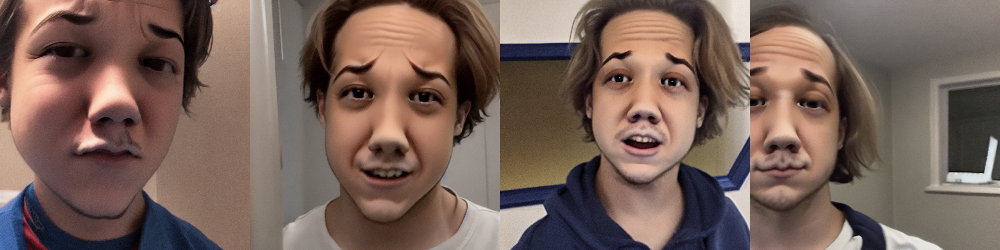

In [26]:
orig_canvas

In [50]:
noised_state_dict = {}
noise_fac = 0.05
for k, v in orig_state_dict.items():
    if isinstance(v, torch.Tensor):
        noised_state_dict[k] = v + torch.randn_like(v) * noise_fac

In [51]:
missing, unexpected = pipe.unet.load_state_dict(noised_state_dict, strict=False)
missing, unexpected = pipe.text_encoder.load_state_dict(noised_state_dict, strict=False)
pipe = pipe.to("cuda", torch.float16)

In [52]:
seed = 3
torch.manual_seed(seed)
images = pipe(["a photo of a sks person"]*4, height=640, width=640, num_inference_steps=30).images

noise_canvas = Image.new('RGB', (640*4, 640))
for i, image in enumerate(images):
    noise_canvas.paste(image, (640*i, 0))

100%|██████████| 30/30 [00:05<00:00,  5.14it/s]


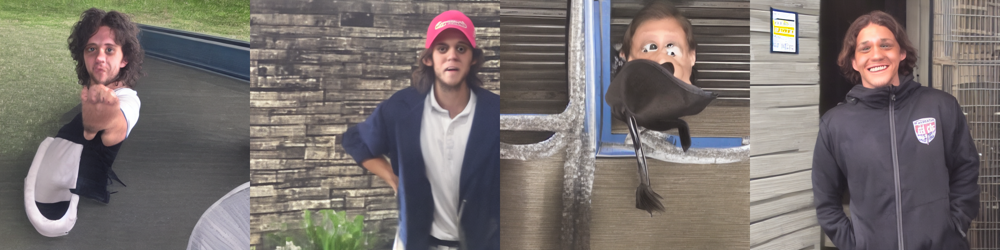

In [53]:
noise_canvas

In [13]:
lora_bundle_path = "/home/ubuntu/AutoLoRADiscovery/lora_bundle.pt"
lora_bundle = torch.load(lora_bundle_path)
lora_bundle = [make_weight_vector(lora_bundle[i])[0] for i in range(len(lora_bundle))]
loras = torch.stack(lora_bundle).cuda()#.to(torch.float16)

In [130]:
def get_a_lora(std=0.125, kurtosis=3.35):
    weights = dist(num_samples=loras.shape[0], mean=0, std=std, kurtosis=kurtosis, skewness=0.0)
    weights = torch.tensor(weights).to(loras.device).to(loras.dtype)
    weights = weights - weights.mean()
    a_lora = torch.sum(weights[:,None] * loras, dim=0)
    return a_lora, weights

In [131]:
orig_lora_vec.norm()

tensor(17.2969, device='cuda:0', dtype=torch.float16)

In [132]:
import random
randint = random.randint(0, 100000)
torch.manual_seed(randint)
a_lora, weights = get_a_lora(0.0987)

In [133]:
a_lora.norm()

tensor(20.4563, device='cuda:0')

In [134]:
state_dict_new = recover_lora(a_lora.unsqueeze(0), weight_dict)

In [135]:
missing, unexpected = pipe.unet.load_state_dict(state_dict_new, strict=False)
missing, unexpected = pipe.text_encoder.load_state_dict(state_dict_new, strict=False)
pipe = pipe.to("cuda", torch.float16)

100%|██████████| 30/30 [00:05<00:00,  5.20it/s]


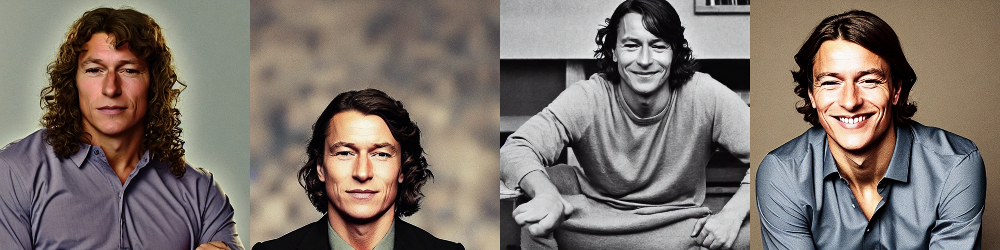

: 

In [136]:
torch.manual_seed(seed)
images = pipe(["a photo of a sks person"]*4, height=640, width=640, num_inference_steps=30).images
canvas = Image.new('RGB', (640*4, 640))
for i, image in enumerate(images):
    canvas.paste(image, (640*i, 0))
canvas

In [51]:
num_times = 1 # higher numbers will further depart from the person
fac = 1.0

first_mean = None
new_lora_vec = orig_lora_vec.clone() / 0.0152
for i in range(num_times):
    with torch.no_grad():
        mean, logvar = lora_vae.encoder(new_lora_vec)
        if first_mean is None:
            first_mean = mean
        std = torch.exp(0.5 * logvar)
        eps = torch.randn_like(std)
        z = mean + eps * std * fac
        new_lora_vec = lora_vae.decoder(z)

new_lora_vec = new_lora_vec * 0.0152

state_dict_new = recover_lora(new_lora_vec, weight_dict)
state_dict_new = convert_to_multi(state_dict_new, idx=0)

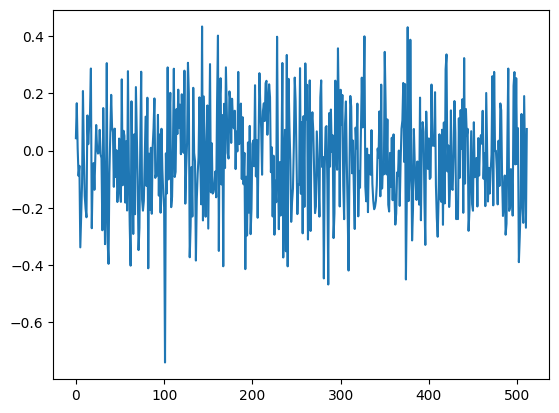

In [52]:
plt.plot(first_mean.squeeze().cpu(), label='mean')

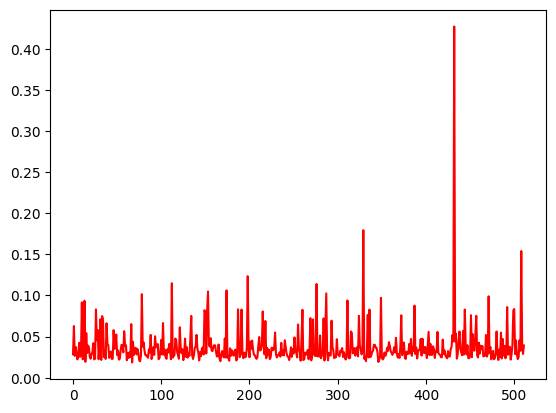

In [53]:
plt.plot(std.squeeze().cpu(), label='std', color='red')

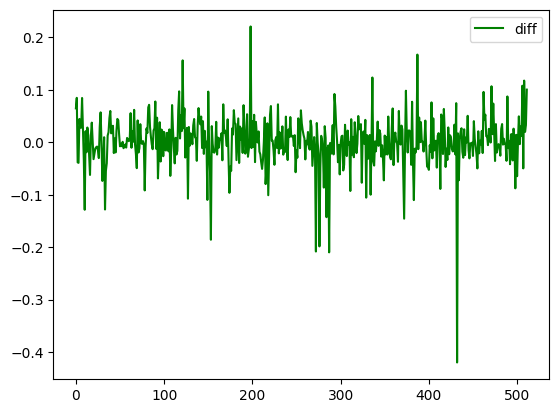

In [54]:
diff = z - first_mean
plt.plot(diff.squeeze().cpu(), label='diff', color='green')
plt.legend()

In [31]:
real_diff = new_lora_vec - orig_lora_vec

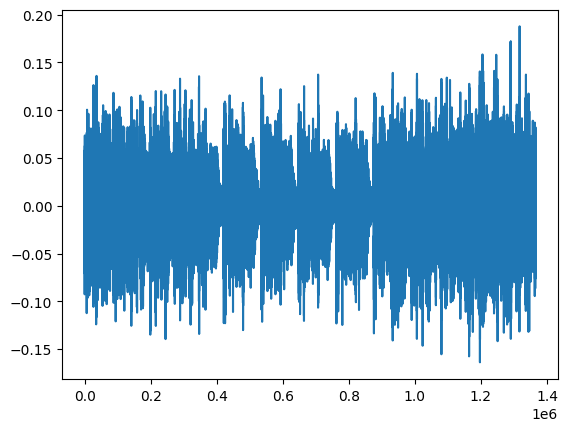

In [32]:
plt.plot(real_diff.squeeze().cpu(), label='real_diff')

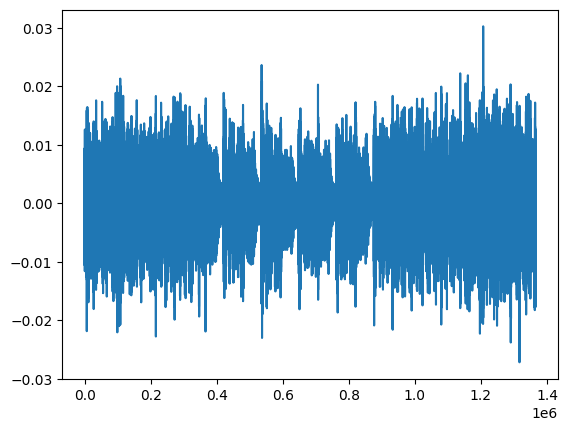

In [19]:
plt.plot(new_lora_vec.squeeze().cpu(), label='new_lora_vec')

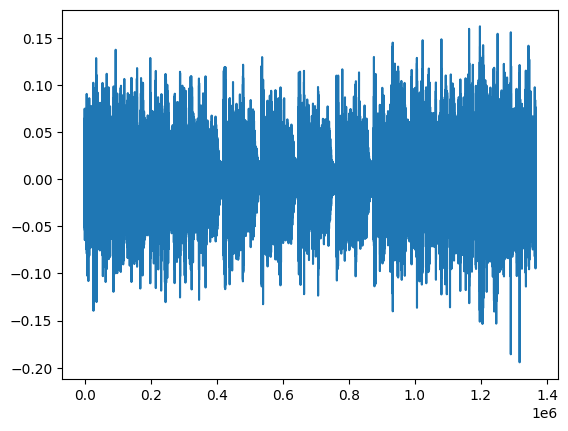

In [20]:
plt.plot(orig_lora_vec.squeeze().cpu(), label='orig_lora_vec')

In [55]:
missing, unexpected = pipe.unet.load_state_dict(state_dict_new, strict=False)
missing, unexpected = pipe.text_encoder.load_state_dict(state_dict_new, strict=False)
pipe = pipe.to("cuda", torch.float16)

In [56]:
torch.manual_seed(seed)
images = pipe(["a photo of a sks person"]*4, height=640, width=640, num_inference_steps=30).images

100%|██████████| 30/30 [00:05<00:00,  5.25it/s]


In [57]:
canvas = Image.new('RGB', (640*4, 640))
for i, image in enumerate(images):
    canvas.paste(image, (640*i, 0))

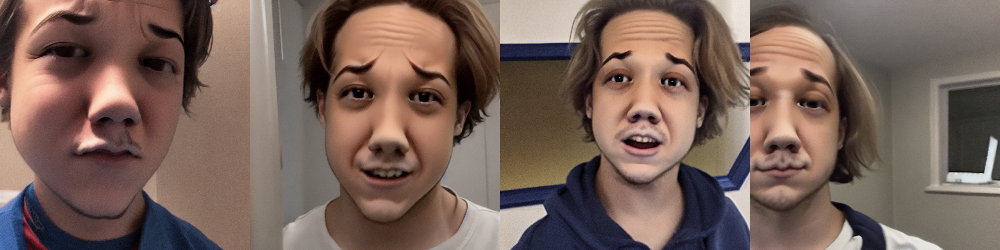

In [42]:
orig_canvas

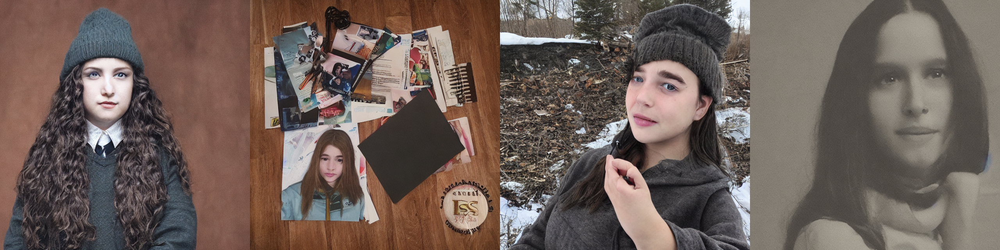

: 

In [58]:
canvas